<a href="https://colab.research.google.com/github/fatemafaria142/Jawline-and-Cheekbones-Enhancement/blob/main/Ariana_Grande_Cheekbones_Enhancement_using_SDXL_DreamBooth_LoRA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Fine-tuning Stable Diffusion XL with DreamBooth and LoRA**

* [Stable Diffusion XL (SDXL)](https://huggingface.co/docs/diffusers/main/en/api/pipelines/stable_diffusion/stable_diffusion_xl): A latent diffusion model for text-to-image synthesis. Compared to previous versions of Stable Diffusion, SDXL leverages a three times larger UNet backbone: The increase of model parameters is mainly due to more attention blocks and a larger cross-attention context as SDXL uses a second text encoder.
* [DreamBooth](https://huggingface.co/docs/diffusers/main/en/training/dreambooth): DreamBooth is a training technique that updates the entire diffusion model by training on just a few images of a subject or style. It works by associating a special word in the prompt with the example images.

* [LoRA](https://huggingface.co/docs/diffusers/main/en/training/lora): LoRA (Low-Rank Adaptation of Large Language Models) is a popular and lightweight training technique that significantly reduces the number of trainable parameters. It works by inserting a smaller number of new weights into the model and only these are trained. This makes training with LoRA much faster, memory-efficient, and produces smaller model weights (a few hundred MBs), which are easier to store and share. LoRA can also be combined with other training techniques like DreamBooth to speedup training.




### **Check the GPU**

In [1]:
# Check the GPU
!nvidia-smi

Fri Feb  2 05:15:02 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

* If you want to install a package quietly (without displaying output), you can use the -q option like this

In [2]:
# Install dependencies.
!pip install bitsandbytes transformers accelerate peft -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.0/105.0 MB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 270.9/270.9 kB 31.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.4/183.4 kB 23.2 MB/s eta 0:00:00


### **Make sure to install `diffusers` from `main`**

In [3]:
!pip install git+https://github.com/huggingface/diffusers.git -q

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


### **Download diffusers SDXL DreamBooth training script.**

In [4]:
!wget https://raw.githubusercontent.com/huggingface/diffusers/main/examples/dreambooth/train_dreambooth_lora_sdxl.py

--2024-02-02 05:15:57--  https://raw.githubusercontent.com/huggingface/diffusers/main/examples/dreambooth/train_dreambooth_lora_sdxl.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 73210 (71K) [text/plain]
Saving to: ‘train_dreambooth_lora_sdxl.py’

train_dreambooth_lo 100%[===================>]  71.49K  --.-KB/s    in 0.01s   

2024-02-02 05:15:57 (5.64 MB/s) - ‘train_dreambooth_lora_sdxl.py’ saved [73210/73210]



## **Custom Dataset**
**Let's get our training data!**
* If your images are saved locally, and you want to add BLIP generated captions


# **Upload example images from local files:**

In [5]:
import os
from google.colab import files

# pick a name for the image folder
local_dir = "./beautiful_girl/"
os.makedirs(local_dir)
os.chdir(local_dir)

# choose and upload local images into the newly created directory
uploaded_images = files.upload()
os.chdir("/content") # back to parent directory

Saving image_1.jpg to image_1.jpg
Saving image_2.jpg to image_2.jpg
Saving image_3.jpg to image_3.jpg
Saving image_4.jpg to image_4.jpg
Saving image_5.jpg to image_5.jpg
Saving image_6.jpg to image_6.jpg
Saving image_7.jpg to image_7.jpg
Saving image_8.jpg to image_8.jpg
Saving image_9.jpg to image_9.jpg
Saving image_10.jpg to image_10.jpg
Saving image_11.jpg to image_11.jpg
Saving image_12.jpg to image_12.jpg
Saving image_13.jpg to image_13.jpg
Saving image_14.jpg to image_14.jpg
Saving image_15.jpg to image_15.jpg
Saving image_16.jpg to image_16.jpg
Saving image_17.jpg to image_17.jpg
Saving image_18.jpg to image_18.jpg
Saving image_19.jpg to image_19.jpg


### **Show some images from the dataset**

In [6]:
from PIL import Image

def image_grid(imgs, rows, cols, resize=256):

    if resize is not None:
        imgs = [img.resize((resize, resize)) for img in imgs]
    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

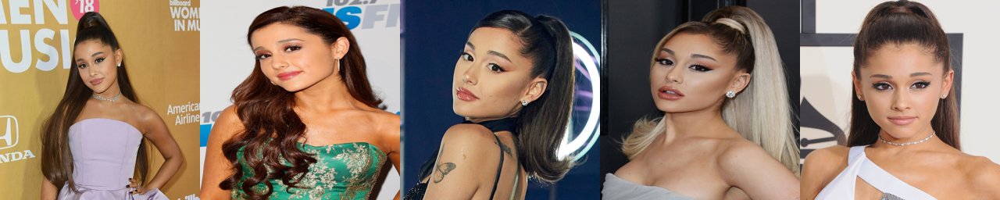

In [7]:
import glob

# change path to display images from local dir
img_paths = "./beautiful_girl/*.jpg"
imgs = [Image.open(path) for path in glob.glob(img_paths)]

num_imgs_to_preview = 5
image_grid(imgs[:num_imgs_to_preview], 1, num_imgs_to_preview)

### **Generate custom captions with BLIP**
[BLIP Model Link :]( https://huggingface.co/Salesforce/blip-image-captioning-base)
Load BLIP to auto caption our images

In [8]:
import requests
from transformers import AutoProcessor, BlipForConditionalGeneration
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"

# load the processor and the captioning model
blip_processor = AutoProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
blip_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base",torch_dtype=torch.float16).to(device)

# captioning utility
def caption_images(input_image):
    inputs = blip_processor(images=input_image, return_tensors="pt").to(device, torch.float16)
    pixel_values = inputs.pixel_values

    generated_ids = blip_model.generate(pixel_values=pixel_values, max_length=50)
    generated_caption = blip_processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return generated_caption

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

In [9]:
import glob
from PIL import Image

# create a list of (Pil.Image, path) pairs
local_dir = "./beautiful_girl/"
imgs_and_paths = [(path,Image.open(path)) for path in glob.glob(f"{local_dir}*.jpg")] #This is a list comprehension that creates a list of tuples. Each tuple consists of a file path (path) and a corresponding PIL.Image object created by Image.open(path).

In [10]:
imgs_and_paths

[('./beautiful_girl/image_14.jpg',
  <PIL.WebPImagePlugin.WebPImageFile image mode=RGB size=1080x1080>),
 ('./beautiful_girl/image_13.jpg',
  <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1200x1800>),
 ('./beautiful_girl/image_9.jpg',
  <PIL.WebPImagePlugin.WebPImageFile image mode=RGB size=1080x1080>),
 ('./beautiful_girl/image_3.jpg',
  <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1080x1440>),
 ('./beautiful_girl/image_1.jpg',
  <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=2441x2919>),
 ('./beautiful_girl/image_16.jpg',
  <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1349x1600>),
 ('./beautiful_girl/image_7.jpg',
  <PIL.WebPImagePlugin.WebPImageFile image mode=RGB size=1300x866>),
 ('./beautiful_girl/image_19.jpg',
  <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1200x1533>),
 ('./beautiful_girl/image_18.jpg',
  <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=640x887>),
 ('./beautiful_girl/image_5.jpg',
  <PIL.WebPImagePlugin.WebPI

### **Now let's add the concept token identifier `(beautiful girl)` to each caption using a caption prefix.**


In [11]:
import json

caption_prefix = "a photo of beautiful girl, "
with open(f'{local_dir}metadata.jsonl', 'w') as outfile:
  for img in imgs_and_paths:
      caption = caption_prefix + caption_images(img[1]).split("\n")[0]
      entry = {"file_name":img[0].split("/")[-1], "prompt": caption}
      json.dump(entry, outfile)
      outfile.write('\n')

# **Free some memory**
* This line imports the `gc` (garbage collector) module, which provides an interface to the garbage collection facility for automatic memory management.
* Here, the `del` statement is used to delete the variables blip_processor and blip_model. This means that the references to these objects are removed, and their memory can be reclaimed by the garbage collector.
* The `gc.collect()` function is called to manually run the garbage collector. This helps to identify and collect objects that are no longer in use, freeing up memory.
* `torch.cuda.empty_cache()` function releases all unused cached memory currently held by the GPU (Graphics Processing Unit).

In [12]:
import gc

# delete the BLIP pipelines and free up some memory
del blip_processor, blip_model
gc.collect()
torch.cuda.empty_cache()

# **Prepration for training**
Initialize `accelerate`:

In [13]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!accelerate config default

accelerate configuration saved at /root/.cache/huggingface/accelerate/default_config.yaml


### **Log into Hugging Face account**
Pass [your **write** access token](https://huggingface.co/settings/tokens) so that we can push the trained checkpoints to the Hugging Face Hub:

In [14]:
from huggingface_hub import notebook_login
notebook_login()

#### **Set Training Hyperparameters**
To ensure we can DreamBooth with LoRA on a heavy pipeline like Stable Diffusion XL, we're using:

* Gradient checkpointing (`--gradient_accumulation_steps`)
* 8-bit Adam (`--use_8bit_adam`)
* Mixed-precision training (`--mixed-precision="fp16"`)
* To allow for custom captions we need to install the `datasets` library, you can skip that if you want to train solely
 with `--instance_prompt`.
In that case, specify `--instance_data_dir` instead of `--dataset_name`

In [15]:
!pip install datasets -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 507.1/507.1 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 16.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 17.0 MB/s eta 0:00:00


 - Use `--output_dir` to specify our LoRA model repository name!
 - Use `--caption_column` to specify name of the cpation column in our dataset. In this example we used "prompt" to
 save our captions in the
 metadata file
 * https://huggingface.co/stabilityai/stable-diffusion-xl-base-1.0
 * https://huggingface.co/madebyollin/sdxl-vae-fp16-fix

In [16]:
#!/usr/bin/env bash
!accelerate launch train_dreambooth_lora_sdxl.py \
  --pretrained_model_name_or_path="stabilityai/stable-diffusion-xl-base-1.0" \
  --pretrained_vae_model_name_or_path="madebyollin/sdxl-vae-fp16-fix" \
  --dataset_name="beautiful_girl" \
  --output_dir="beautiful_girl_LoRA" \
  --caption_column="prompt"\
  --mixed_precision="fp16" \
  --instance_prompt="a photo of beautiful girl" \
  --resolution=512 \
  --train_batch_size=1 \
  --gradient_accumulation_steps=3 \
  --gradient_checkpointing \
  --learning_rate=1e-4 \
  --snr_gamma=5.0 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --mixed_precision="fp16" \
  --use_8bit_adam \
  --max_train_steps=500 \
  --checkpointing_steps=717 \
  --seed="0"

2024-02-02 05:25:30.684816: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-02 05:25:30.684871: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-02 05:25:30.687367: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-02 05:25:33.489678: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
02/02/2024 05:25:35 - INFO - __main__ - Distributed environment: NO
Num processes: 1
Process index: 0
Local process index: 0
Device: cuda

Mixed precision type: fp16

tokenizer/tokenizer_config.json: 100% 737/737 [00:00<00:00, 2.83MB/s]
toke

### **Saving our model to the hub**

In [17]:
from huggingface_hub import whoami
from pathlib import Path
#make sure the `output_dir` we specify here is the same as the one used for training
output_dir = "beautiful_girl_LoRA"
username = whoami(token=Path("/root/.cache/huggingface/"))["name"]
repo_id = f"{username}/{output_dir}"

In [18]:
# Sometimes training finishes succesfuly (i.e. a **.safetensores** file with the LoRA weights saved properly to your local `output_dir`) but there's not enough RAM in the free tier to push the model to the hub
# To mitigate this, run this cell with your training arguments to make sure your model is uploaded!
# push to the hub
from train_dreambooth_lora_sdxl import save_model_card
from huggingface_hub import upload_folder, create_repo

repo_id = create_repo(repo_id, exist_ok=True).repo_id

# change the params below according to our training arguments
save_model_card(
    repo_id = repo_id,
    images=[],
    base_model="stabilityai/stable-diffusion-xl-base-1.0",
    train_text_encoder=False,
    instance_prompt="a photo of beautiful girl",
    validation_prompt=None,
    repo_folder=output_dir,
    vae_path="madebyollin/sdxl-vae-fp16-fix",
)

upload_folder(
    repo_id=repo_id,
    folder_path=output_dir,
    commit_message="End of training",
    ignore_patterns=["step_*", "epoch_*"],
)

pytorch_lora_weights.safetensors:   0%|          | 0.00/23.4M [00:00<?, ?B/s]

events.out.tfevents.1706851830.d825dca269f5.5122.0:   0%|          | 0.00/113k [00:00<?, ?B/s]

events.out.tfevents.1706851830.d825dca269f5.5122.1:   0%|          | 0.00/3.25k [00:00<?, ?B/s]

Upload 3 LFS files:   0%|          | 0/3 [00:00<?, ?it/s]

CommitInfo(commit_url='https://huggingface.co/Potato142/beautiful_girl_LoRA/commit/719c3c561b7a1980dc2e1c46e49cb7f14c3a7420', commit_message='End of training', commit_description='', oid='719c3c561b7a1980dc2e1c46e49cb7f14c3a7420', pr_url=None, pr_revision=None, pr_num=None)

In [19]:
from IPython.display import display, Markdown

link_to_model = f"https://huggingface.co/{repo_id}"
display(Markdown("### Our model has finished training.\nWe can access it here: {}".format(link_to_model)))

### Our model has finished training.
We can access it here: https://huggingface.co/Potato142/beautiful_girl_LoRA

## **Inference**
* **Let's generate some images with our trained model!**

In [20]:
import torch
from diffusers import DiffusionPipeline, AutoencoderKL

vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)
pipe = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    vae=vae,
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
)
pipe.load_lora_weights(repo_id)
_ = pipe.to("cuda")

Fetching 17 files:   0%|          | 0/17 [00:00<?, ?it/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

pytorch_lora_weights.safetensors:   0%|          | 0.00/23.4M [00:00<?, ?B/s]

### **Here are some general descriptors that are often used to discuss different types of Cheekbones:**

## **High Cheekbones:**

* High cheekbones are often considered a desirable facial feature. They create a well-defined and sculpted look on the face.
* People with high cheekbones typically have a more pronounced arch along the upper part of the cheeks.

  0%|          | 0/100 [00:00<?, ?it/s]

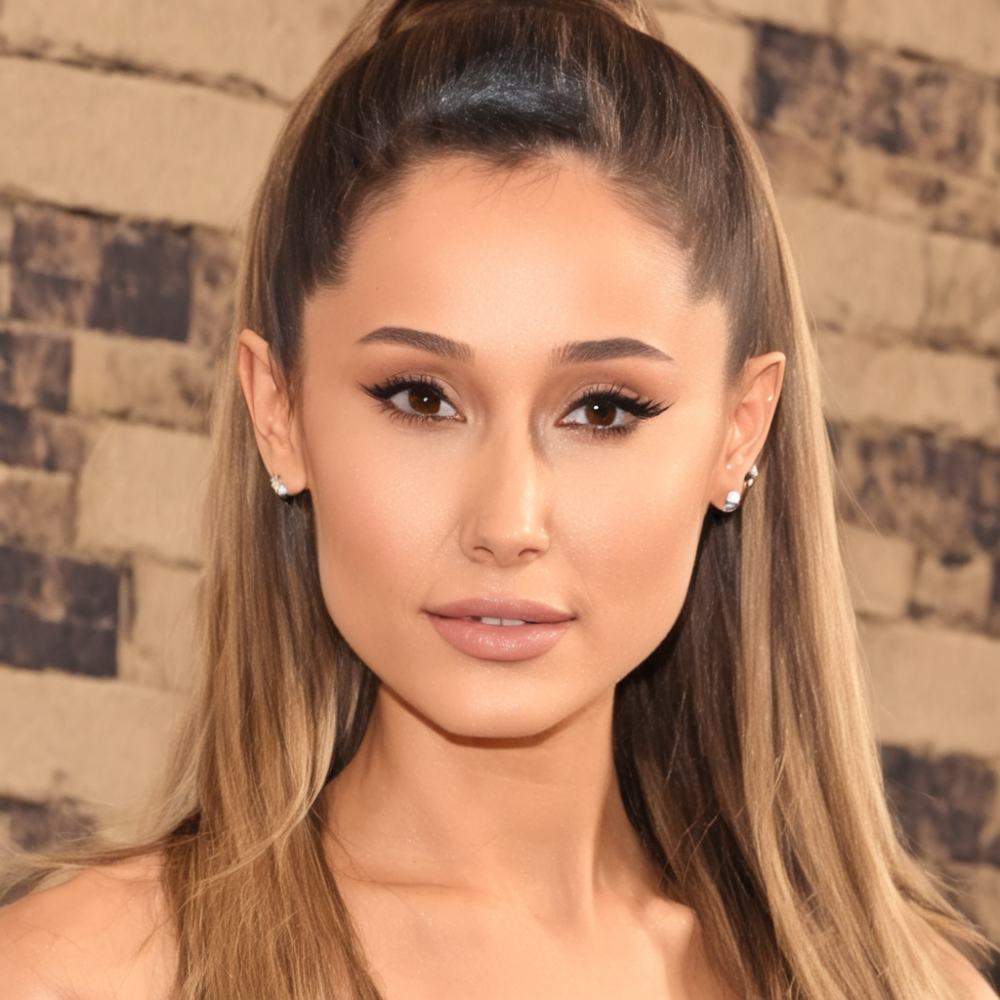

In [22]:
from PIL import Image
prompt = '''a photo of a beautiful girl with high cheekbones, characterized by a well-defined and sculpted look on the face.
The high cheekbones contribute to a more pronounced arch along the upper part of the cheeks.'''

image = pipe(prompt=prompt, num_inference_steps=100).images[0]
image

## **Low Cheekbones:**

* Some individuals may have lower-set cheekbones, which might not be as prominently visible.
* Low cheekbones may contribute to a softer and rounder facial appearance.


  0%|          | 0/120 [00:00<?, ?it/s]

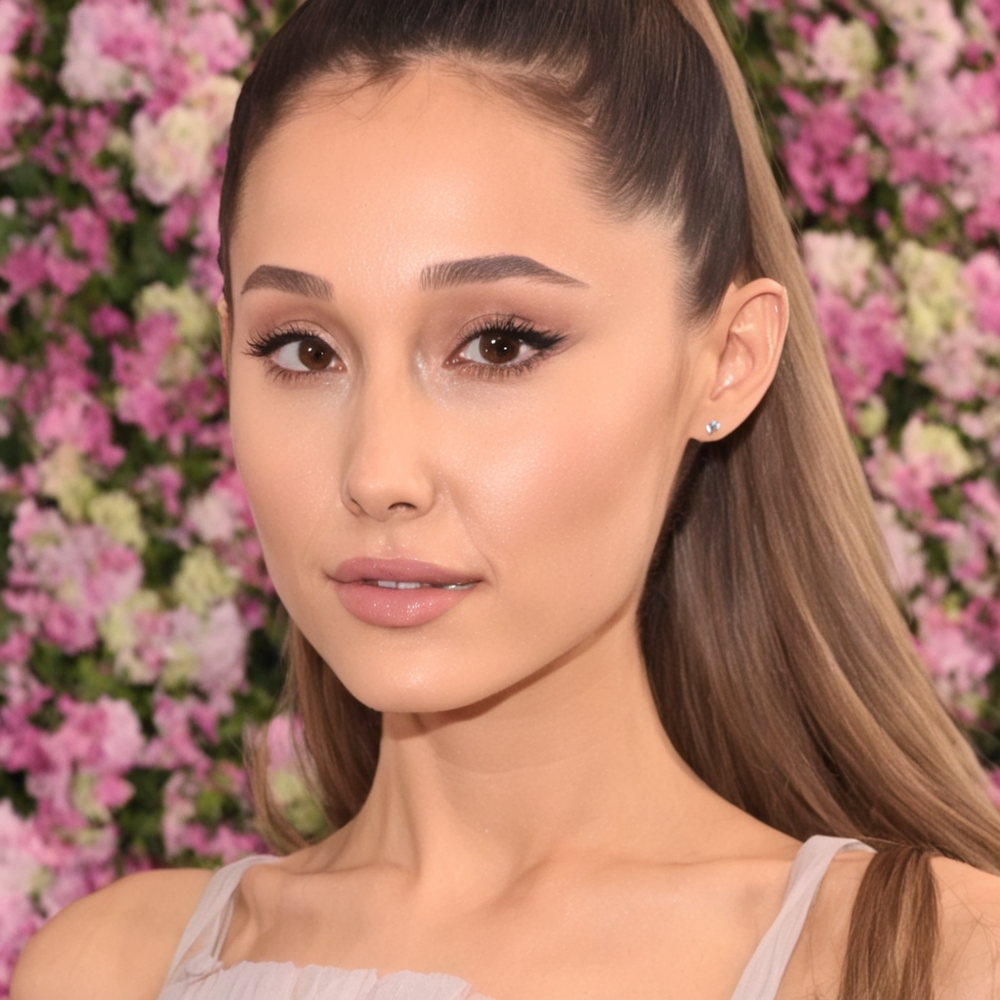

In [23]:
prompt = '''a photo of a beautiful girl with low-set cheekbones, characterized by a softer and rounder facial appearance.
Low cheekbones might not be as prominently visible, contributing to a gentle and graceful look.'''

image = pipe(prompt=prompt, num_inference_steps=120).images[0]
image

## **Wide Cheekbones:**

* Wide cheekbones extend horizontally across the face, creating a broad and expansive appearance.
* People with wide cheekbones may have a strong and angular facial structure.



  0%|          | 0/100 [00:00<?, ?it/s]

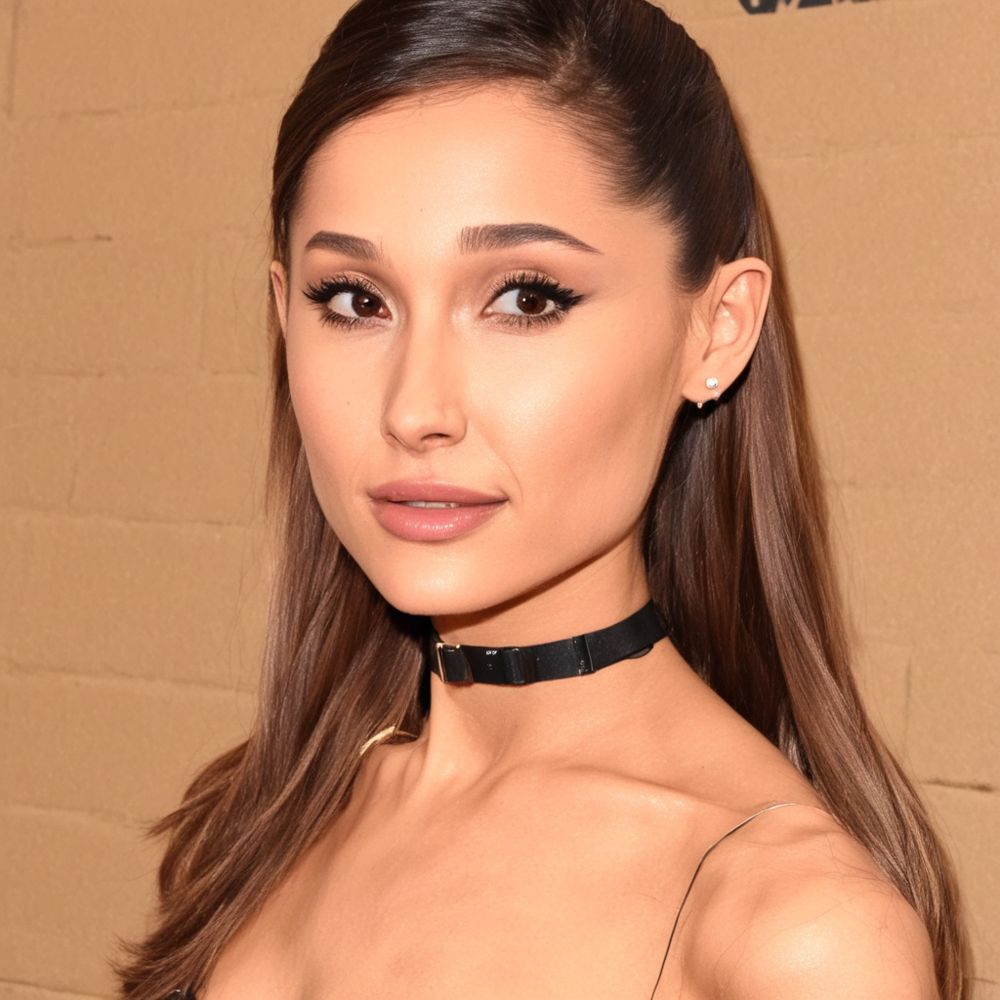

In [24]:
prompt = '''a photo of a beautiful girl with wide cheekbones, characterized by a broad and expansive appearance.
People with wide cheekbones may exhibit a strong and angular facial structure.'''

image = pipe(prompt=prompt, num_inference_steps=100).images[0]
image

## **Narrow Cheekbones:**

* Narrow cheekbones are closer together, contributing to a more slender and delicate facial appearance.
* This feature may be associated with a softer or more oval face shape.

  0%|          | 0/100 [00:00<?, ?it/s]

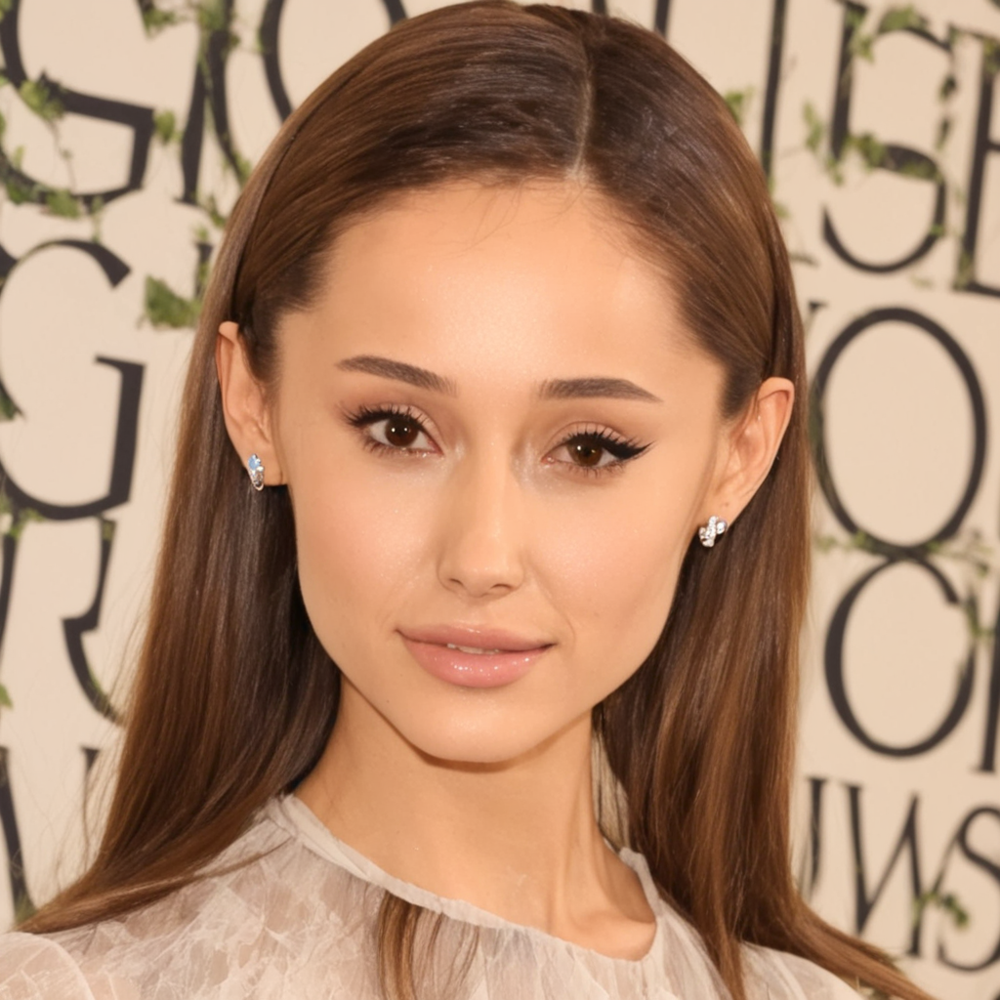

In [25]:
prompt = '''a photo of a beautiful girl with narrow cheekbones, characterized by a more slender and delicate facial appearance.
Narrow cheekbones are closer together, contributing to a softer and more oval face shape.'''

image = pipe(prompt=prompt, num_inference_steps=100).images[0]
image

## **Prominent Zygomatic Arch:**

* The zygomatic arch is part of the cheekbone structure. Some individuals may have a more pronounced zygomatic arch, contributing to the overall appearance of their cheekbones.

  0%|          | 0/120 [00:00<?, ?it/s]

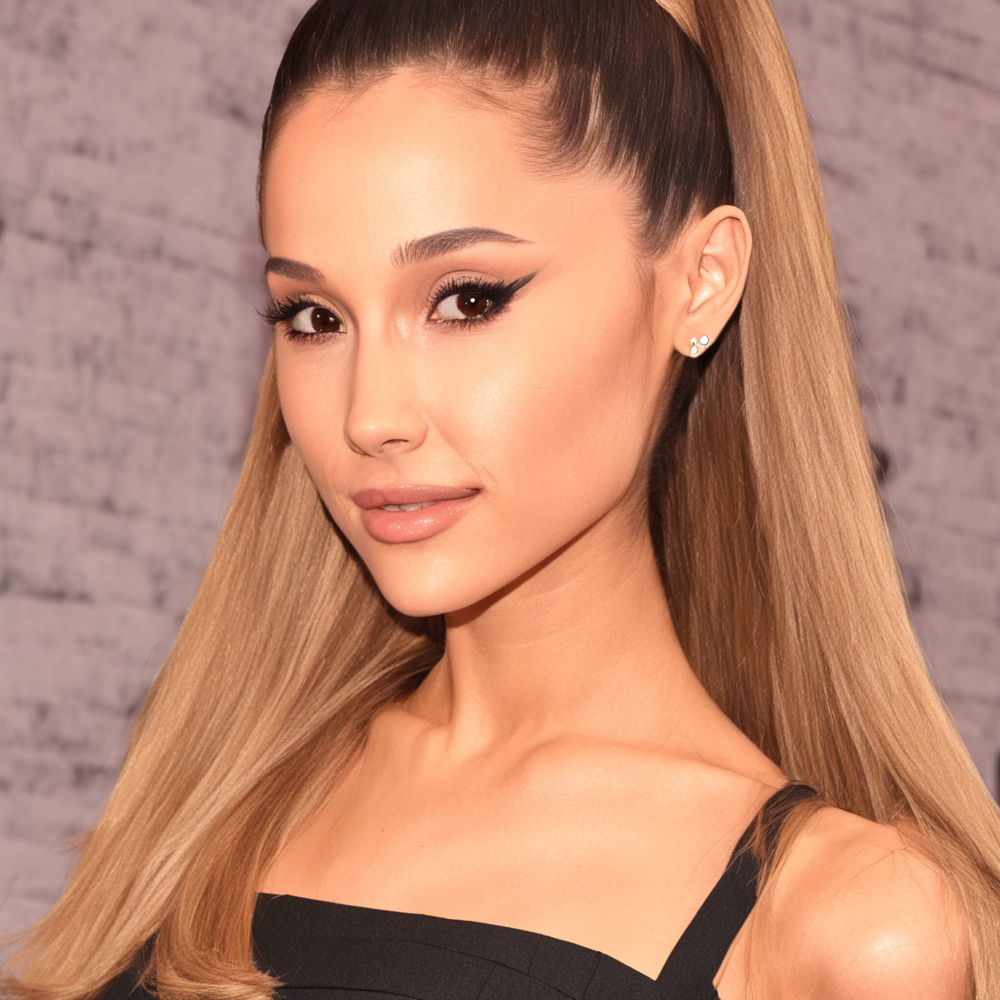

In [26]:
prompt = '''a photo of a beautiful girl with a prominent zygomatic arch, characterized by a more pronounced structure in the cheekbones.
The zygomatic arch contributes to the overall appearance, creating a sculpted and defined look.'''

image = pipe(prompt=prompt, num_inference_steps=120).images[0]
image

## **Flat Cheekbones:**

* Flat cheekbones have less projection and may appear more subtle.
This feature is often associated with a smoother and less angular facial appearance.

  0%|          | 0/120 [00:00<?, ?it/s]

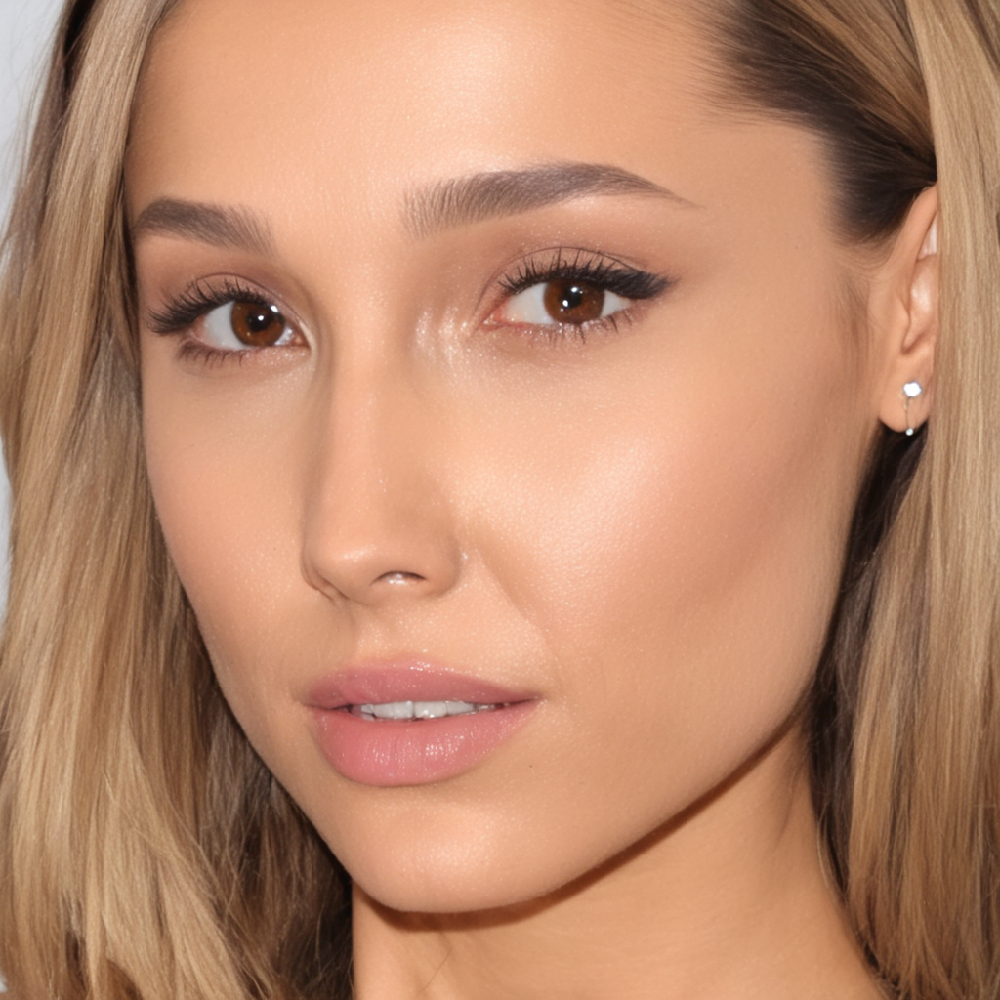

In [32]:
prompt = '''a photo of a beautiful girl with flat cheekbones, characterized by less projection and a more subtle appearance.
Flat cheekbones are often associated with a smoother and less angular facial appearance.'''

image = pipe(prompt=prompt, num_inference_steps=120).images[0]
image